In [1]:
import os
from os import path
import shutil
import platform
from datetime import datetime
from datetime import timedelta
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
import geopandas as gpd 
import json
from COVID import COVID as cvd

# Paths for files

In [2]:
pf = platform.system()

if pf == 'Linux':
    dataPath = '/home/joe/Dev/COVID-19/csse_covid_19_data/csse_covid_19_daily_reports'
    dataPathTimeSeries  = '/home/joe/Dev/COVID-19/csse_covid_19_data/csse_covid_19_time_series/'
    countryPopFile = '/home/joe/Dev/API_SP.POP.TOTL_DS2_en_csv_v2_887275/API_SP.POP.TOTL_DS2_en_csv_v2_887275.csv'
else:
    gitPath = '/Users/joehardy/Dev/COVID-19/'
    dataPath = '/Users/joehardy/Dev/COVID-19/csse_covid_19_data/csse_covid_19_daily_reports'
    dataPathTimeSeries  = '/Users/joehardy/Dev/COVID-19/csse_covid_19_data/csse_covid_19_time_series/'
    countryPopFile = '/Users/joehardy/Dev/API_SP.POP.TOTL_DS2_en_csv_v2_887275/API_SP.POP.TOTL_DS2_en_csv_v2_887275.csv'
    countyPopFile = '/Users/joehardy/Dev2020/SodalicData/notebooks/data/co-est2019-annres.csv'


pop_filename = './data/us_states_pop_2018.csv'
confirmedGlobalFile = 'time_series_covid19_confirmed_global.csv'
confirmedUSFile = 'time_series_covid19_confirmed_US.csv'
deathsGlobalFile = 'time_series_covid19_deaths_global.csv'
deathsUSFile = 'time_series_covid19_deaths_US.csv'
recoveredGlobalFile = 'time_series_covid19_recovered_global.csv'

In [3]:
pd.set_option("display.max_columns", 144)

# Define today

In [4]:
# Use this line to just write out the day you want to use
#today = '04-22-2020'

#Use this line if you have data for YESTERDAY
today = datetime.today()
today = today - timedelta(days=1)
today = today.strftime('%m-%d-%Y')

#Define todayCoronaFile
todayCoronaFile = today+'.csv'

# Load data from CSVs

In [5]:
df = pd.read_csv(dataPath + '/' + todayCoronaFile)
df_us = pd.read_csv(dataPath + '_us/' + todayCoronaFile)
df_pop = pd.read_csv(countryPopFile)
df_ts_confirmed_US = pd.read_csv(dataPathTimeSeries + confirmedUSFile)
df_ts_deaths_US = pd.read_csv(dataPathTimeSeries + deathsUSFile)
us_states_pop = pd.read_csv('./data/us_states_pop_2018.csv', thousands=',')

FileNotFoundError: [Errno 2] File b'./data/us_states_pop_2018.csv' does not exist: b'./data/us_states_pop_2018.csv'

# Country-specific data
## Analyze per country and look at per capita 

In [6]:
# Load the Country class
cvdCountries = cvd.COVIDCountryTotals(df, df_pop)

# Get the merged country and population data
df_countries_pop_merged = cvdCountries.mergeCountriesWithPop()

# Divide the cases by the population and sort based on confirmed cases
df_countries_per_capita = cvdCountries.countriesPerCapita()

# Sort the df based on number of confirmed cases on a per capita basis
df_countries_per_capita_sorted = df_countries_per_capita.sort_values(by='Confirmed Per Capita')

# State-specific time series data
## Confirmed cases

In [7]:
# Load the State class
cvdStates = cvd.COVIDTimeSeries(df_ts_confirmed_US, us_states_pop)

# Merge the time series data with population
df_states_ts_merged = cvdStates.mergeStatesWithPop()

# Divide all cases by the populations of the states
df_states_ps_pc = cvdStates.statesPerCapita()

# Transpose the dfs, drop the population data, and reindex on date
df_states_t, df_states_pc_t = cvdStates.stateTimeSeries()

# Get daily new cases both for 
df_daily, df_daily_pc = cvdStates.stateDailyNewCases()

# Sum up the whole country
df_daily_us, df_daily_us_pc = cvdStates.usDailyNewCases()

# get rolling averages (7 day)
df_rolling7, df_rolling7_pc, df_rolling7_us, df_rolling7_us_pc = cvdStates.rollingAve()

NameError: name 'us_states_pop' is not defined

## Deaths

In [8]:
# Create the deaths version of the time series class
cvdTSStatesDeaths = cvd.COVIDTimeSeries(df_ts_deaths_US, us_states_pop)

# Merge the time series data with population
df_deaths_ts_merged = cvdTSStatesDeaths.mergeStatesWithPop()

# Divide all cases by the populations of the states
df_deaths_ps_pc = cvdTSStatesDeaths.statesPerCapita()

# Transpose the dfs, drop the population data, and reindex on date
df_deaths_t, df_deaths_pc_t = cvdTSStatesDeaths.stateTimeSeries()

# Get daily new cases both for 
df_deaths, df_deaths_pc = cvdTSStatesDeaths.stateDailyNewCases()

# Sum up the whole country 
df_deaths_us, df_deaths_us_pc = cvdTSStatesDeaths.usDailyNewCases()

# get rolling averages (7 day)
df_deaths_rolling7, df_deaths_rolling7_pc, df_deaths_rolling7_us, df_deaths_rolling7_us_pc = cvdTSStatesDeaths.rollingAve()


NameError: name 'us_states_pop' is not defined

# Testing

In [9]:
df_us = df_us.set_index('Province_State')
df_us_sorted_testing = df_us.sort_values('Testing_Rate')

df_us['Hit_rate'] = df_us['Incident_Rate']/df_us['Testing_Rate']
df_us_sorted_hit_rate = df_us.sort_values('Hit_rate')

df_us_sorted_deaths = df_us.sort_values('Deaths', ascending=False)

# Make graphs

In [10]:
# Load the charts class
cvdCharts = cvd.COVIDCharts()

## Active cases, deaths, and recovered for select countries

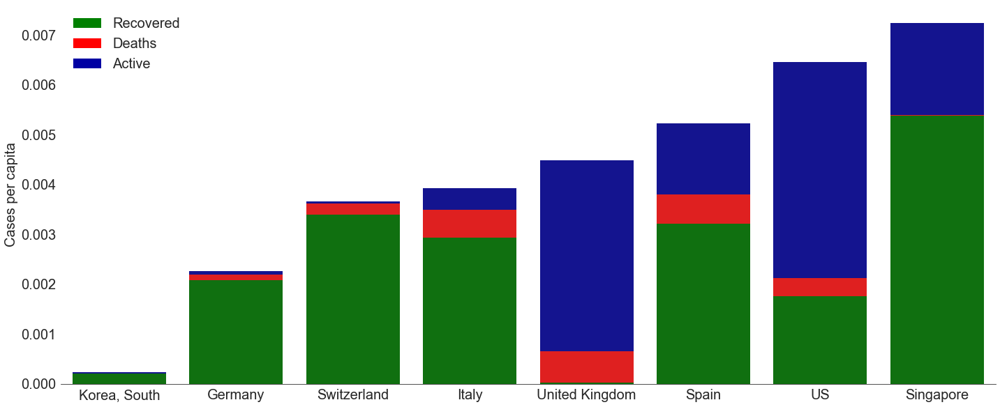

In [11]:
p1 = cvdCharts.stackedBar(df_countries_per_capita_sorted, countries=['US', 'Italy', 'Spain', 'Korea, South', 'United Kingdom', 'Germany', 'Singapore', 'Switzerland'])

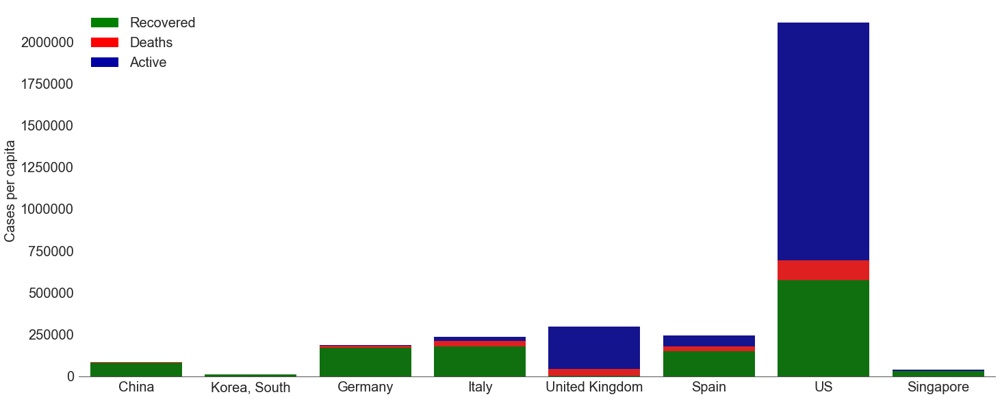

In [12]:
p1_1 = cvdCharts.stackedBar(df_countries_per_capita_sorted, y1='Confirmed', y2='Recovered', y3='Deaths')

In [13]:
p2 = cvdCharts.timeSeriesLines(df_states_pc_t, 
                                    '2020-03-09', 
                                    ['New York', 'New Jersey', 'Louisiana', 
                                    'Massachusetts', 'Connecticut', 'Michigan', 
                                    'Georgia', 'California', 'Maine', 
                                    'Rhode Island'],
                                    ylabel = 'Confirmed Cases per 100,000')

NameError: name 'df_states_pc_t' is not defined

In [14]:
p3 = cvdCharts.timeSeriesLines(df_daily_pc, 
                                    '2020-03-09', 
                                    ['California', 'Texas', 'Arizona', 'Florida', 'Iowa', 'Nebraska', 'Louisiana', 'New York'], 
                                    ylabel = 'Confirmed Cases per 100,000')


NameError: name 'df_daily_pc' is not defined

In [15]:
p4 = cvdCharts.timeSeriesBar(df_daily_pc, '2020-03-09', 'Iowa')


NameError: name 'df_daily_pc' is not defined

In [16]:
p4_1 = cvdCharts.timeSeriesBar(df_daily_pc, '2020-03-09', 'California')

NameError: name 'df_daily_pc' is not defined

In [17]:
p4_2 = cvdCharts.timeSeriesBarAndLine(df_daily_pc, df_rolling7_pc, '03-09-2020', column='California', 
                                    ylabel='Confirmed Cases per 100,000', title_text='Confirmed Cases per 100,000, per Day California \n (line = 7 day rolling ave)')

NameError: name 'df_daily_pc' is not defined

In [18]:
p5 = cvdCharts.timeSeriesTwoBars(df_daily_pc, '2020-03-09', 'Iowa', 'New York')

NameError: name 'df_daily_pc' is not defined

In [19]:
p6 = cvdCharts.timeSeriesTwoBars(df_deaths_pc, '2020-03-09', 'New York', 'California')

NameError: name 'df_deaths_pc' is not defined

In [20]:
p7 = cvdCharts.timeSeriesUSBar(df_rolling7_us, '03-09-2020', ylabel = "Cases per Day, 7 Day Rolling Ave", title_text = "Daily Confirmed Cases from COVID-19\n US Total (7 day rolling ave)")


NameError: name 'df_rolling7_us' is not defined

In [21]:
p8 = cvdCharts.timeSeriesBarAndLine(df_daily_us, df_rolling7_us, '03-09-2020', column=0, 
                                    ylabel='Confirmed Cases', title_text='Confirmed Cases per Day US \n (line = 7 day rolling ave)')


NameError: name 'df_daily_us' is not defined

In [22]:
p9 = cvdCharts.timeSeriesBarAndLine(df_deaths_us, df_deaths_rolling7_us, '03-09-2020', column=0, 
                                    ylabel='Confirmed Deaths', title_text='Confirmed Deaths per Day US \n (line = 7 day rolling ave)')

NameError: name 'df_deaths_us' is not defined

In [23]:
df_us_sorted_testing[['Testing_Rate']]

,Testing_Rate
Province_State,
Puerto Rico,200.790344
American Samoa,312.719038
Virgin Islands,2216.877354
Idaho,3524.214284
Oregon,4122.637329
Colorado,4325.341533
Hawaii,4341.776658
Texas,4534.302648
Missouri,4561.210331


In [24]:
df_us_sorted_hit_rate[['Hit_rate']]

,Hit_rate
Province_State,
American Samoa,0.000000
Northern Mariana Islands,0.003672
Alaska,0.008907
Montana,0.009994
Hawaii,0.011973
West Virginia,0.017597
Guam,0.021124
Vermont,0.021462
Virgin Islands,0.030278


In [25]:
today_cases = pd.DataFrame(df_states_t.loc[today].sort_values(ascending=False))
today_cases

NameError: name 'df_states_t' is not defined

In [26]:
pd.DataFrame(df_states_pc_t.loc[today].sort_values(ascending=False))

NameError: name 'df_states_pc_t' is not defined

In [27]:
df_us_sorted_deaths[['Deaths']]

,Deaths
Province_State,
New York,30856
New Jersey,12708
Massachusetts,7647
Illinois,6326
Pennsylvania,6243
Michigan,6018
California,5114
Connecticut,4204
Louisiana,3018


In [28]:
df_us_sorted_deaths[['Deaths']].sum()

Deaths    116127
dtype: int64

In [29]:
df_deaths.loc[today, 'Florida']

NameError: name 'df_deaths' is not defined

# Map data from census 
https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html



## Big national map and states maps in geopandas dfs

In [30]:
state_geofile = '/Users/joehardy/Dev2020/SodalicData/notebooks/data/cb_2018_us_state_500k/cb_2018_us_state_500k.shp'
state_gdf = gpd.read_file(state_geofile)
nation_geofile = '/Users/joehardy/Dev2020/SodalicData/notebooks/data/cb_2018_us_nation_5m/cb_2018_us_nation_5m.shp'
nation_gdf = gpd.read_file(nation_geofile)

## Merge the state geo data with the number of cases, then reduce to the lower 48

In [31]:
todays_total_cases_pc = pd.DataFrame(df_states_pc_t.loc[today].sort_values(ascending=False))
states_map_cases = state_gdf.merge(todays_total_cases_pc, left_on='NAME', right_on='States')
states_map_cases.columns = [*states_map_cases.columns[:-1], 'Cases']
lower_48_cases = states_map_cases.loc[states_map_cases['STUSPS'].isin(['AK', 'HI', 'PR'])==False]

NameError: name 'df_states_pc_t' is not defined

## Map the total case burden with a color coding by state

In [32]:
p10 = cvdCharts.mapWithColoredGeos(lower_48_cases)

NameError: name 'lower_48_cases' is not defined

## Map the testing rates by state

In [33]:
states_map_tests = state_gdf.merge(df_us_sorted_testing['Testing_Rate'], left_on='NAME', right_on='Province_State')
states_map_tests.columns = [*states_map_tests.columns[:-1], 'Testing_Rate']
lower_48_tests = states_map_tests.loc[states_map_tests['STUSPS'].isin(['AK', 'HI', 'PR', 'AS', 'GU'])==False]

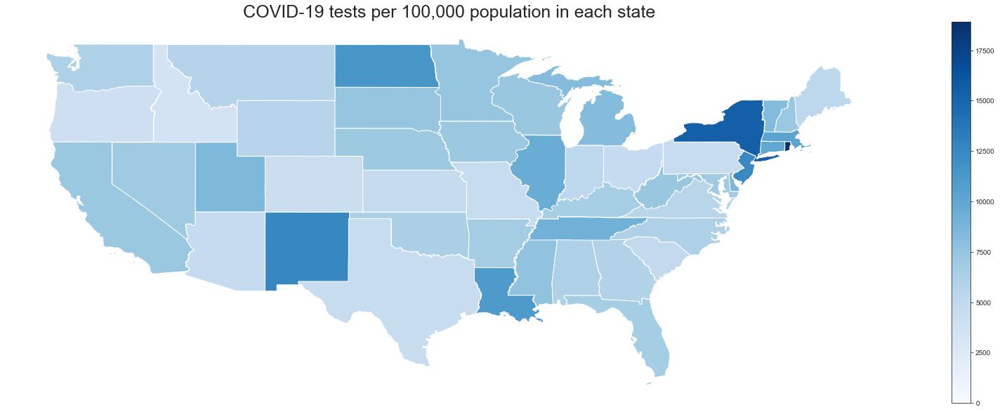

In [34]:
p11 = cvdCharts.mapWithColoredGeos(lower_48_tests, title='COVID-19 tests per 100,000 population in each state', cm='Blues', column='Testing_Rate')

In [35]:
todays_cases = df_daily_pc.loc[df_daily_pc.index==today].transpose()
states_map_today = state_gdf.merge(todays_cases[today], left_on='NAME', right_on='States')
states_map_today.columns = [*states_map_today.columns[:-1], 'Todays Cases']
lower_48_today = states_map_today.loc[states_map_today['STUSPS'].isin(['AK', 'HI', 'PR', 'AS', 'GU'])==False]

NameError: name 'df_daily_pc' is not defined

In [36]:
p12 = cvdCharts.mapWithColoredGeos(lower_48_today, title='COVID-19 cases ' + today + ' per 100,000 population in each state', cm='Reds', column='Todays Cases')

NameError: name 'lower_48_today' is not defined

In [37]:
p12.savefig("todays_cases.png")

NameError: name 'p12' is not defined

In [38]:
countyPopFile = '/Users/joehardy/Dev2020/SodalicData/notebooks/data/co-est2019-annres.csv'
df_county_pop = pd.read_csv(countyPopFile)

In [39]:
# Load the Counties class
cvdCounties = cvd.COVIDCounties(df_ts_confirmed_US, df_county_pop)

# Get the merged counry and population data
df_counties = cvdCounties.mergeCountiesWithPop()

# Divide the cases by the population and sort based on confirmed cases
df_counties, df_counties_per_capita = cvdCounties.countiesPerCapita()

df_counties_ts, df_counties_ts_pc = cvdCounties.countiesTimeSeries()
# Sort the df based on number of confirmed cases on a per capita basis
#df_countries_per_capita_sorted = df_countries_per_capita.sort_values(by='Confirmed Per Capita')

In [40]:
df_cali_counties = df_counties_ts_pc['California']
pd.DataFrame(df_cali_counties.loc[today].sort_values(ascending=False)) 

,2020-06-15
County,
Imperial,2371.768341
Kings,1197.201517
Los Angeles,735.443900
Tulare,571.434700
Santa Barbara,463.382897
Riverside,456.781618
Kern,374.027163
San Bernardino,344.711330
San Mateo,338.389168


In [41]:
df_daily_counties, df_daily_counties_pc = cvdCounties.countiesDailyNewCases() 
df_cali_counties_pc = df_daily_counties_pc['California']

In [42]:
df_daily_counties_rolling7, df_daily_counties_pc_rolling7 = cvdCounties.rollingAve() 
df_daily_counties_pc_rolling7_cali = df_daily_counties_pc_rolling7['California']

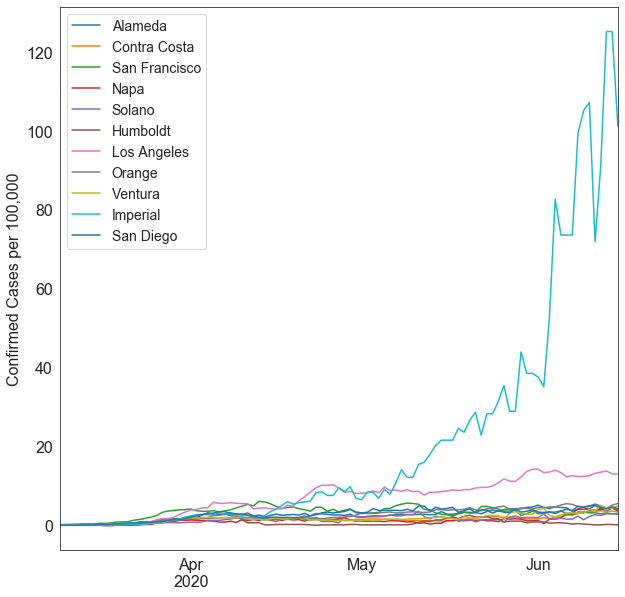

In [43]:
p14 = cvdCharts.timeSeriesLines(df_daily_counties_pc_rolling7_cali, 
                                    '2020-03-09', 
                                    ['Alameda', 'Contra Costa', 'San Francisco', 
                                    'Napa','Solano', 'Humboldt', 'Los Angeles', 
                                    'Orange', 'Ventura', 'Imperial', 'San Diego'], 
                                    ylabel = 'Confirmed Cases per 100,000')

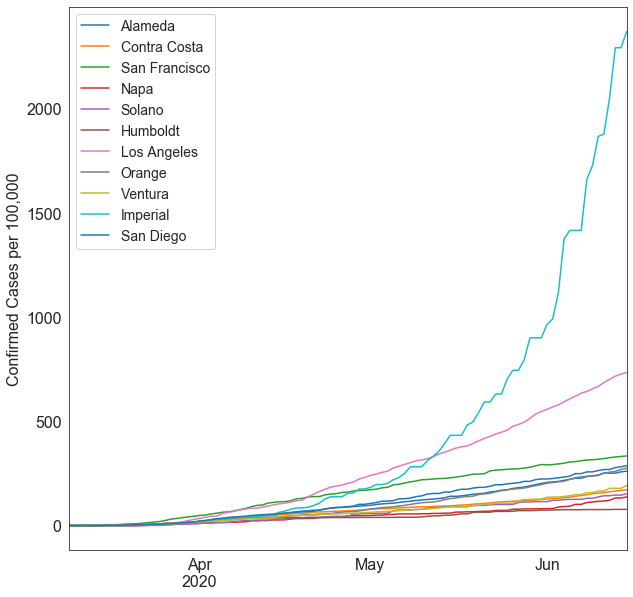

In [44]:
p15 = cvdCharts.timeSeriesLines(df_cali_counties, 
                                    '2020-03-09', 
                                    ['Alameda', 'Contra Costa', 'San Francisco', 
                                    'Napa','Solano', 'Humboldt', 'Los Angeles', 
                                    'Orange', 'Ventura', 'Imperial', 'San Diego'], 
                                    ylabel = 'Confirmed Cases per 100,000')


## Grab county shape data for California

In [45]:
county_geofile = '/Users/joehardy/Dev2020/SodalicData/notebooks/data/cb_2018_us_county_500k/cb_2018_us_county_500k.shp'
county_gdf = gpd.read_file(county_geofile)

## Organize to plot total cases to date for California counties

In [46]:
cali_cumulative_cases = df_cali_counties.loc[df_cali_counties.index==today].transpose()
cali_today_cases = df_daily_counties_pc_rolling7_cali.loc[df_daily_counties_pc_rolling7_cali.index==today].transpose() 

cali_gdf = county_gdf.loc[county_gdf['STATEFP']=='06']

cali_map_cum_today = cali_gdf.merge(cali_cumulative_cases[today], left_on='NAME', right_on='County')
cali_map_cum_today.columns = [*cali_map_cum_today.columns[:-1], 'Total Cases PC']

cali_map_today_cases = cali_gdf.merge(cali_today_cases[today], left_on='NAME', right_on='County')
cali_map_today_cases.columns = [*cali_map_today_cases.columns[:-1], 'Total Cases PC']

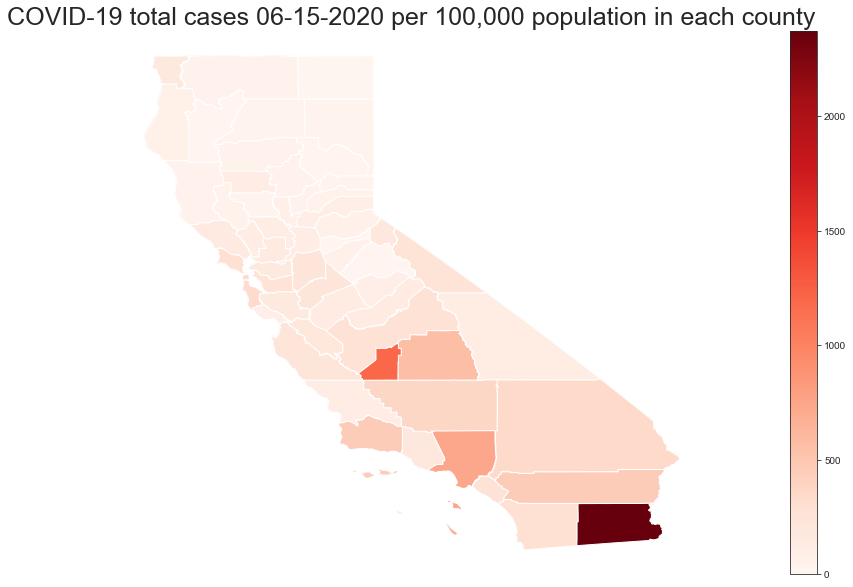

In [47]:
p15 = cvdCharts.mapWithColoredGeos(cali_map_cum_today, geo='GEOID',
                                                     cm='Reds', 
                                                     column='Total Cases PC', 
                                                     title='COVID-19 total cases ' + today + ' per 100,000 population in each county')

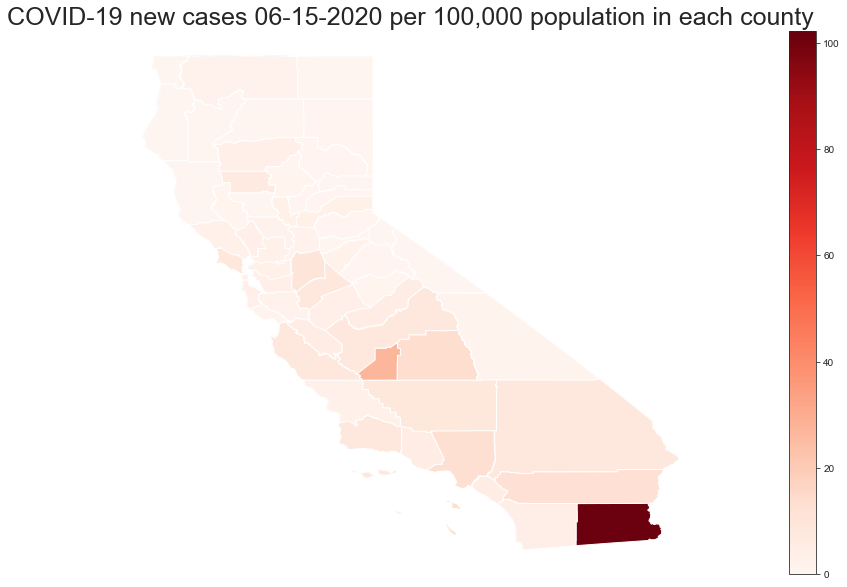

In [48]:
p16 = cvdCharts.mapWithColoredGeos(cali_map_today_cases, geo='GEOID',
                                                     cm='Reds', 
                                                     column='Total Cases PC', 
                                                     title='COVID-19 new cases ' + today + ' per 100,000 population in each county')

In [49]:
df_cali_counties = df_daily_counties['California']

In [50]:
df_cali_counties[['Contra Costa']]

County,Contra Costa
Date,
2020-01-22,NaN
2020-01-23,0.0
2020-01-24,0.0
2020-01-25,0.0
2020-01-26,0.0
2020-01-27,0.0
2020-01-28,0.0
2020-01-29,0.0
2020-01-30,0.0


In [51]:
df_daily

NameError: name 'df_daily' is not defined